In [16]:
import xarray as xr
import ODLintake
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from xrsignal import xrsignal
from NI_tools.NI_tools import calculate
from dask.distributed import Client
import xrft
from scipy import signal
import scipy
import hvplot.xarray

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 32,Total memory: 62.80 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33889,Workers: 8
Dashboard: http://127.0.0.1:8787/status,Total threads: 32
Started: Just now,Total memory: 62.80 GiB
Comm: tcp://127.0.0.1:40945,Total threads: 4
Dashboard: http://127.0.0.1:41971/status,Memory: 7.85 GiB
Nanny: tcp://127.0.0.1:34873,


In [6]:
ds = ODLintake.open_ooi_DAS_SouthTx()
ds_slice = ds.isel({'distance':slice(3000*8, 3000*(8+4)), 'time':slice(0,3000*4)})

# Build PWS

In [182]:
da_pp = calculate.preprocess(ds_slice['RawData'],dim='time', W=15, Fs=200)

In [184]:
NCCF_pws = np.abs(calculate.compute_MultiElement_NCCF_PhaseWeight(da_pp, time_dim='time', W=15).mean('time'))

In [ ]:
NCCF_pws = NCCF_pws.compute()

# f-k filtering

In [9]:
da = ds_slice['RawData'].load()

In [22]:
Fs = 200 #Hz
Ds = 1/2.0419046878814697 #1/m

f_coords = np.linspace(-Fs/2, Fs/2, 12000)
wn_coords = np.linspace(-Ds/2, Ds/2, 12000)

da_fk = xr.DataArray(scipy.fft.fft2(da.values), dims=['wavenumber','frequency'], coords={'wavenumber':wn_coords, 'frequency':f_coords}, name='fk array')

In [26]:
fk_plot = (20*np.log10(np.abs(da_fk.loc[0:,0:]))).hvplot.image(rasterize=True, xlabel='frequency [Hz]', ylabel='wavenumber [1/m]')

:DynamicMap   []
   :Image   [frequency,wavenumber]   (fk array)

In [83]:
def fk_mask(freq_coords, wave_coords, v1, v2):
    # Calculate the velocity corresponding to each frequency and wavenumber coordinate
    velocity = freq_coords[:, np.newaxis] / wave_coords[np.newaxis, :]
    
    # Create a mask based on the velocity values
    mask = np.logical_and(velocity >= v1, velocity <= v2)
    
    return mask.astype(float)

def fk_mask2(freq_coords, wave_coords, v1, v2):
    # Calculate the velocity corresponding to each frequency and wavenumber coordinate
    velocity = np.sqrt((freq_coords[:, np.newaxis] / wave_coords[np.newaxis, :])**2)
    
    # Create a mask based on the velocity values
    mask = np.logical_and(velocity >= v1, velocity <= v2)
    
    # Create a conjugate symmetric mask
    mask = np.logical_or(mask, mask[::-1, :])
    
    return mask

In [65]:
mask = fk_mask(da_fk.frequency.values, da_fk.wavenumber.values, 1000,2000)

In [84]:
mask2 = fk_mask2(da_fk.frequency.values, da_fk.wavenumber.values, 1000,2000)

In [86]:
mask2_t = scipy.fft.ifft2(mask2)

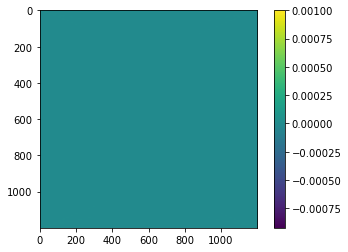

In [94]:
plt.imshow(np.real(mask2_t)[::10,::10], vmax=0.001)
plt.colorbar()

In [68]:
da_fk_filtered = np.abs(da_fk)*mask*np.exp(1j*xr.apply_ufunc(np.angle, da_fk))

In [71]:
(20*np.abs(da_fk_filtered)).hvplot(rasterize=True)

:DynamicMap   []
   :Image   [frequency,wavenumber]   (fk array)

In [74]:
da_filtered = xr.DataArray(np.real(scipy.fft.ifft2(da_fk_filtered.values)), dims=['distance','time'], coords={'distance':da.distance, 'time':da.time}, name='filtered array')


- ifft doesn't return real values, hard coding it away for now

In [77]:
da_filtered.hvplot.image(rasterize=True, title='filtered') + da.hvplot.image(rasterize=True, title='unfiltered')

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Image   [time,distance]   (filtered array)
   .DynamicMap.II :DynamicMap   []
      :Image   [time,distance]   (RawData)

In [80]:
mask_td = scipy.fft.ifft2(mask)

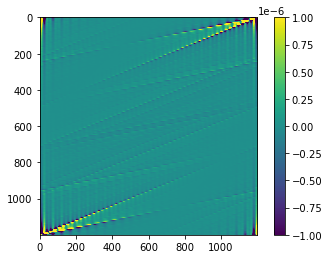

In [102]:
plt.imshow(np.real(mask_td)[::10,::10], vmax=1e-6, vmin=-1e-6)
plt.colorbar()

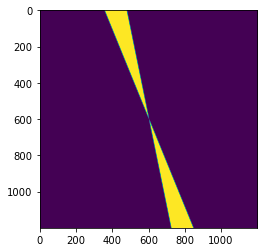

In [67]:
plt.imshow(mask[::10,::10])

In [39]:

# Example usage
freq_coords = np.linspace(0, 1000, 101)
wave_coords = np.linspace(0, 1, 101)
data = np.random.rand(101, 101)
v1 = 100
v2 = 500

filtered_data = fk_filter(freq_coords, wave_coords, data, v1, v2)

/tmp/ipykernel_5941/1415703395.py:5: RuntimeWarning: divide by zero encountered in divide
  velocity = np.sqrt((freq_coords[:, np.newaxis] / wave_coords[np.newaxis, :])**2)
/tmp/ipykernel_5941/1415703395.py:5: RuntimeWarning: invalid value encountered in divide
  velocity = np.sqrt((freq_coords[:, np.newaxis] / wave_coords[np.newaxis, :])**2)
